# Deep Learning Assignment 2 PartB

## Transfer Learning and Fine-Tuning of Mobilenet Model
---

- Name: Savanth Nair
- Student id: 24891626


### 1. Loading and exploring the Dataset

**[1.1]**
First we need to import the SSL module and disable default certificate verfication

In [ ]:
# Solution
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

**[1.2]** First we need to import the relevant class and libraries from PyTorch including 'os' in python.

In [ ]:
# Solution
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torchvision import datasets, transforms
from sklearn.model_selection import train_test_split
from torch.utils.data import Subset, DataLoader
from google.colab import drive

**[1.3]** Downloading and extracting the Dataset

In [ ]:
!pip install wget

import tarfile
import wget
def download_and_extract_dataset(url, destination_path):
    if not os.path.exists(destination_path):
        os.makedirs(destination_path)
    tar_path = os.path.join(destination_path, 'food-101.tar.gz')
    if not os.path.exists(tar_path):
        print("Downloading the dataset... This may take a while!")
        wget.download(url, tar_path)
        print("\nDownload completed!")
    else:
        print("Dataset already downloaded.")

    print("Extracting the dataset...")
    with tarfile.open(tar_path, "r:gz") as tar:
        tar.extractall(path=destination_path)
    print("Extraction completed!")

# URL and destination
url = 'http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz'
destination_path = './data'

download_and_extract_dataset(url, destination_path)

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=b0aa25d1863e018c0717c6b033aaaf315cc2aab839cefe96ebefaa18327be1aa
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget

Download completed!
Extracting the dataset...
Extraction completed!


**[1.4]** Apply transformation using compose class to the image. This time we will not only normalize the images but we will also perform some data transformation such as Resize (image_size, image_size).

In [ ]:
# Solution
image_size = 299
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),  # Resize images while maintaining aspect ratio
    transforms.ToTensor(),  # Convert images to tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize images
])

**[1.5]**
Let's load the dataset using torchvision.datasets.ImageFolder

In [ ]:
import os

def load_food101_data(data_dir, meta_dir):
    classes = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d)) and not d.startswith('.')])
    class_to_idx = {cls_name: idx for idx, cls_name in enumerate(classes)}

    full_data = []

    with open(os.path.join(meta_dir, 'train.txt'), 'r') as file:
        for line in file:
            image_name = line.strip()
            label_name = image_name.split('/')[0]
            image_path = os.path.join(data_dir, image_name + '.jpg')
            label = class_to_idx.get(label_name)
            if label is not None:
                full_data.append((image_path, label))

    with open(os.path.join(meta_dir, 'test.txt'), 'r') as file:
        for line in file:
            image_name = line.strip()
            label_name = image_name.split('/')[0]
            image_path = os.path.join(data_dir, image_name + '.jpg')
            label = class_to_idx.get(label_name)
            if label is not None:
                full_data.append((image_path, label))

    return full_data

data_dir = '/content/data/food-101/images'
meta_dir = '/content/data/food-101/meta'
full_data = load_food101_data(data_dir, meta_dir)




### 2.   Preparing the Dataset

**[2.1]**
Lets split the size of the full_dataset into train, test and validation data set according to following ratio 70%:15%:15% and save it into train_ratio, val_ratio and test_ratio.

In [ ]:
# Solution
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

**[2.2]**
According to the size of the dataset, now we will split a dataset into several subsets such as train_set,val_set, and test_set.

In [ ]:
# Solution
# Split indices into training and combined validation/test indices
train_indices, test_val_indices = train_test_split(range(len(full_data)), test_size=(val_ratio + test_ratio), random_state=42)

# Split combined validation/test indices into separate validation and test indices
val_indices, test_indices = train_test_split(test_val_indices, test_size=test_ratio/(val_ratio + test_ratio), random_state=42)

train_set = Subset(full_data, train_indices)  # Subset for training data
val_set = Subset(full_data, val_indices)      # Subset for validation data
test_set = Subset(full_data, test_indices)    # Subset for test data

**[2.3]**  Now we will call the DataLoader function that iteratively loads data based on batch size, shuffle and save it into three different variables called `train_loader`, `val_loader` and `test_loader`. Set the `BATCH_SIZE` to 64. The shuffle is a boolean variable. By default the shuffle value is false. If the shuffle is `True` means that the data is randomly shuffled before each epoch, so the order of the data is different in each epoch.

In [ ]:
# Solution
batch_size = 64
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)


**[2.4]** Creating a 10% sample of training validation and test set and used the data loader function

In [ ]:
# Assuming subset_data is your Subset object
import random
# Calculate the number of samples to select (10% of the total samples)
sample_size_train = int(0.1 * len(train_loader.dataset))
sample_size_val = int(0.1 * len(val_loader.dataset))
sample_size_test = int(0.1 * len(test_loader.dataset))

# Create a list of indices from the Subset object
indices_train = list(range(len(train_loader.dataset)))
indices_val = list(range(len(val_loader.dataset)))
indices_test = list(range(len(test_loader.dataset)))

# Randomly sample 10% of the indices
sampled_indices_train = random.sample(indices_train, k=sample_size_train)
sampled_indices_val = random.sample(indices_val, k=sample_size_val)
sampled_indices_test = random.sample(indices_test, k=sample_size_test)

# Create a new Subset object with the sampled indices
sampled_subset_train = torch.utils.data.Subset(train_loader.dataset, sampled_indices_train)
sampled_subset_val = torch.utils.data.Subset(val_loader.dataset, sampled_indices_val)
sampled_subset_test = torch.utils.data.Subset(test_loader.dataset, sampled_indices_test)

print(len(sampled_subset_train))
print(len(sampled_subset_val))
print(len(sampled_subset_test))



7070
1515
1515


In [ ]:
batch_size = 128
sample_train_loader = DataLoader(sampled_subset_train, batch_size=batch_size, shuffle=True)
sample_val_loader = DataLoader(sampled_subset_val, batch_size=batch_size, shuffle=False)
sample_test_loader = DataLoader(sampled_subset_test, batch_size=batch_size, shuffle=False)

**[2.4]**  Let's have a look at the length of `train_set`, `val_set`, and `test_set`.

In [ ]:
# Print sizes of datasets
print("Training set size:", len(train_set))
print("Validation set size:", len(val_set))
print("Test set size:", len(test_set))

Training set size: 70700
Validation set size: 15150
Test set size: 15150


**[2.5]** Let's print the class labels of the dataset.

In [ ]:
import os

def load_food101_data(data_dir, meta_dir):
    classes = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d)) and not d.startswith('.')])
    class_to_idx = {cls_name: idx for idx, cls_name in enumerate(classes)}

    full_data = []

    with open(os.path.join(meta_dir, 'train.txt'), 'r') as file:
        for line in file:
            image_name = line.strip()
            label_name = image_name.split('/')[0]
            image_path = os.path.join(data_dir, image_name + '.jpg')
            label = class_to_idx.get(label_name)
            if label is not None:
                full_data.append((image_path, label))

    with open(os.path.join(meta_dir, 'test.txt'), 'r') as file:
        for line in file:
            image_name = line.strip()
            label_name = image_name.split('/')[0]
            image_path = os.path.join(data_dir, image_name + '.jpg')
            label = class_to_idx.get(label_name)
            if label is not None:
                full_data.append((image_path, label))

    return classes

data_dir = '/content/data/food-101/images'
meta_dir = '/content/data/food-101/meta'
class_labels = load_food101_data(data_dir, meta_dir)

# Print the class labels
print("Class labels:", class_labels)
print(f"Total number of classes: {len(class_labels)}")


Class labels: ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macaro

**[2.6]** Now we will display the images with the labels.

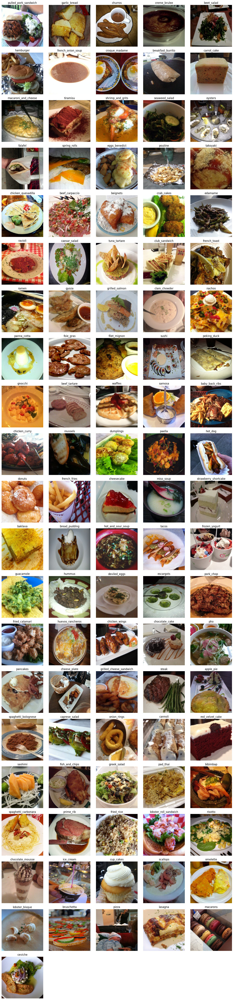

In [ ]:
# Solution
import matplotlib.pyplot as plt  # Import matplotlib for plotting
import numpy as np  # Import NumPy for numerical operations
from PIL import Image

# Define a function to display images with labels
def show_images(images, labels, class_labels):
    # Calculate the number of images and rows required
    num_images = len(images)
    num_rows = (num_images + 4) // 5  # 5 images per row, rounded up
    # Create a figure and axes for subplots
    fig, axes = plt.subplots(num_rows, 5, figsize=(15, 3 * num_rows))
    axes = axes.flatten()  # Flatten the axes array for easier indexing

    # Loop through the images and corresponding labels
    for i, (image, label) in enumerate(zip(images, labels)):

        image = Image.open(image)
        # Apply transformations
        image = transform(image).numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])  # Mean values used for normalization
        std = np.array([0.229, 0.224, 0.225])  # Standard deviation values used for normalization
        image = std * image + mean  # Denormalize the image
        image = np.clip(image, 0, 1)  # Clip pixel values to range [0, 1]

        # Display the image and set its title as the class label
        axes[i].imshow(image)  # Display the image
        axes[i].set_title(class_labels[label])  # Set the title of the subplot as the class label
        axes[i].axis('off')  # Hide axis

    # Hide empty subplots
    for j in range(num_images, num_rows * 5):
        axes[j].axis('off')  # Hide axis for empty subplots

    # Adjust layout and display the plot
    plt.tight_layout()  # Adjust the layout of subplots
    plt.show()  # Display the plot

# Get one image from each class
images, labels = [], []  # Initialize lists to store images and labels
classes_found = set()  # Keep track of classes already found
for img, lbl in train_loader:  # Iterate through the training loader
    for image, label in zip(img, lbl):  # Iterate through each image and label in the batch
        # Check if we have already found an image from this class
        if class_labels[label.item()] not in classes_found:
            images.append(image)  # Add the image to the list of images
            labels.append(label)  # Add the label to the list of labels
            classes_found.add(class_labels[label.item()])  # Add the class to the set of found classes
    # If we have found one image from each class, stop looping
    if len(images) == len(class_labels):
        break

# Display one image from each class with 5 images per row
show_images(images, labels, class_labels)  # Call the show_images function to display the images

### 3.   Defining the Architecture of CNN

**[3.1]** Create a variable called `device` that will automatically select a GPU if available. Otherwise it will default to CPU.

In [ ]:
# Solution
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
device

device(type='cuda')

**[3.2]** Now we will initialize the inception_v3 model by specifying the parameter `pretrained = True`, i.e. loading the pre-trained model

In [ ]:
# Solution
mobilenet_model = models.mobilenet_v3_large(pretrained=True)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth
100%|██████████| 21.1M/21.1M [00:00<00:00, 114MB/s] 


**[3.3]** Let's freeze the part of the model by setting the value of `requires_grad` as `false`, i.e. no changes happen to its parameters.

In [ ]:
# Solution
# Freeze all layers
for param in mobilenet_model.parameters():
    param.requires_grad = False

**[3.4]** Head with 3 fully connected layers

In [ ]:
# Solution
mobilenet_model.classifier = nn.Sequential(
    nn.Linear(960, 1024),
    nn.ReLU(),
    nn.Linear(1024, 512),
    nn.ReLU(),
    nn.Linear(512, 101)  # Output layer for 101 classes
)               # Softmax activation for classification
tuned_model = mobilenet_model

In [ ]:
# Solution
print(tuned_model)

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

### 4. Training and Evaluation of the Model

In [ ]:
###[4.1] Instantiate a nn.CrossEntropyLoss() and save it into a variable called criterion. After then Instantiate a torch.optim.Adam() optimizer with the model's parameters and 0.00001 as learning rate and save it into a variable called optimizer.

**[4.1]** Instantiate a nn.CrossEntropyLoss() and save it into a variable called criterion. After then Instantiate a torch.optim.Adam() optimizer with the model's parameters and 0.00001 as learning rate and save it into a variable called optimizer.

In [ ]:
# Solution
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(tuned_model.parameters(), lr=0.001, momentum=0.9)

In [ ]:
tuned_model.to(device)

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

**[4.2]**  Let's introduce a custom class called `Customcallback` to control the behaviours of the training. This class offers the following functionalities:


*   Monitor the training
*   Adjusting learning rates
*   Early stopping


In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau  # Import ReduceLROnPlateau scheduler from PyTorch

class CustomCallback:
    def __init__(self, early_stop_patience=5, reduce_lr_factor=0.2, reduce_lr_patience=3, reduce_lr_min_lr=0.0000001, checkpoint_path='checkpoint.pth', log_dir='logs'):
        # Initialize callback parameters
        self.early_stop_patience = early_stop_patience  # Patience for early stopping
        self.reduce_lr_factor = reduce_lr_factor  # Factor by which to reduce learning rate
        self.reduce_lr_patience = reduce_lr_patience  # Patience for reducing learning rate
        self.reduce_lr_min_lr = reduce_lr_min_lr  # Minimum learning rate
        self.checkpoint_path = checkpoint_path  # Path to save model checkpoints
        # self.log_dir = log_dir  # Directory for logging

        # Initialize variables for early stopping
        self.early_stop_counter = 0  # Counter for early stopping
        self.best_val_loss = float('inf')  # Best validation loss

        self.optimizer = None  # Optimizer for training
        self.scheduler = None  # Learning rate scheduler

    def set_optimizer(self, optimizer):
        # Set optimizer for training
        self.optimizer = optimizer

    def on_epoch_end(self, epoch, val_loss):
        # Early Stopping
        if val_loss < self.best_val_loss:
            self.best_val_loss = val_loss
            self.early_stop_counter = 0  # Reset counter if validation loss improves
        else:
            self.early_stop_counter += 1  # Increment counter if validation loss does not improve

        if self.early_stop_counter >= self.early_stop_patience:
            print("Early stopping triggered!")
            return True  # Stop training if early stopping criterion is met

        # Reduce LR on Plateau
        if self.scheduler is not None:
            self.scheduler.step(val_loss)  # Adjust learning rate based on validation loss

        return False  # Continue training

    def on_train_begin(self):
        # Initialize Reduce LR on Plateau scheduler
        self.scheduler = ReduceLROnPlateau(self.optimizer, mode='min', factor=self.reduce_lr_factor,
                                            patience=self.reduce_lr_patience, min_lr=self.reduce_lr_min_lr)

    def on_train_end(self):
        pass

    def set_model(self, model):
        self.model = model  # Set model for the callback

**[4.3]**  Instantiate a `CustomCallback()` and save it into a variable called `custom_callback`.

In [ ]:
# Solution
custom_callback = CustomCallback()

**[4.3]**  Set the `optimizer` for the `custom_callback`.

In [ ]:
custom_callback.set_optimizer(optimizer)

**[4.4]**  Pass the `tuned_model` as a parameter of the function `set_model` of `custom_callback` class.


In [ ]:
custom_callback.set_model(tuned_model)

**[4.5]**  Set up a learning rate scheduler for `ReduceLROnPlateau` for reducing the learning rate when a metric has stopped improving

In [ ]:
lr_scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, min_lr=1e-6)

**[4.6]** **Training:** Now it is time to train our model. Set the `EPOCHS` to 5 and create a for loop that will iterate based on the EPOCHS value. A nested loop is initiated that extracts images and labels from `train_loader` and introduce the following logics:
- reset the gradients
- perform the forward propagation and get the model predictions
- calculate the loss between the predictions and the actuals
- perform back propagation
- update the weights
- Count the total loss

To validate the model a nested loop is initiated that extracts images and labels from `val_loader` and introduce the following logics:
- disable computing gradients
- perform the forward propagation and get the model predictions
- calculate the loss between the predictions and the actuals
- Count the total loss
- Count the correct outcome

In [ ]:
# Initialize lists to store epoch-wise values
train_losses = []  # List to store training losses
train_accuracies = []  # List to store training accuracies
val_losses = []  # List to store validation losses
val_accuracies = []  # List to store validation accuracies

transform = transforms.Compose([
    transforms.Resize((299, 299)),  # Resize images to 224x224
    transforms.ToTensor(),           # Convert images to tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize images
])

# Training loop
num_epochs = 10  # Number of epochs for training
for epoch in range(num_epochs):
    # Training
    tuned_model.train()  # Set the model to training mode
    running_train_loss = 0.0  # Initialize running training loss
    correct_train = 0  # Initialize number of correctly predicted training samples
    total_train = 0  # Initialize total number of training samples
    for inputs, labels in sample_train_loader:
        batch_images = []  # List to store preprocessed image tensors for this batch
        for path in inputs:
          # Load image from path
          image = Image.open(path).convert('RGB')
          # Apply transformations
          image = transform(image)
          # Add preprocessed image tensor to batch list
          batch_images.append(image)

        # Convert list of image tensors to a batch tensor
        inputs = torch.stack(batch_images)
        inputs, labels = inputs.to(device), labels.to(device)  # Move data to GPU if available
        optimizer.zero_grad()  # Zero the parameter gradients
        outputs = tuned_model(inputs)  # Forward pass
        #print(outputs)
        if isinstance(outputs, tuple):
            logits = outputs[0]  # Unpack logits if model returns tuple
        else:
            logits = outputs
        loss = criterion(logits, labels)  # Calculate loss
        loss.backward()  # Backward pass
        optimizer.step()  # Optimize parameters

        running_train_loss += loss.item() * inputs.size(0)  # Accumulate training loss
        _, predicted = torch.max(logits, 1)  # Get predicted labels
        total_train += labels.size(0)  # Increment total training samples
        correct_train += (predicted == labels).sum().item()  # Increment correctly predicted samples

    # Calculate epoch-wise training loss and accuracy
    epoch_train_loss = running_train_loss / len(sample_train_loader.dataset)  # Average training loss
    train_accuracy = correct_train / total_train  # Training accuracy

    # Validation
    tuned_model.eval()  # Set the model to evaluation mode
    running_val_loss = 0.0  # Initialize running validation loss
    correct_val = 0  # Initialize number of correctly predicted validation samples
    total_val = 0  # Initialize total number of validation samples
    with torch.no_grad():
        for inputs, labels in sample_val_loader:
          batch_images = []  # List to store preprocessed image tensors for this batch
          for path in inputs:
          # Load image from path
            image = Image.open(path).convert('RGB')
          # Apply transformations
            image = transform(image)
          # Add preprocessed image tensor to batch list
            batch_images.append(image)

        # Convert list of image tensors to a batch tensor
          inputs = torch.stack(batch_images)
          inputs, labels = inputs.to(device), labels.to(device)  # Move data to GPU if available
          optimizer.zero_grad()  # Zero the parameter gradients
          outputs = tuned_model(inputs)  # Forward pass
        #print(outputs)
          if isinstance(outputs, tuple):
            logits = outputs[0]  # Unpack logits if model returns tuple
          else:
            logits = outputs
          loss = criterion(logits, labels)  # Calculate loss




          running_val_loss += loss.item() * inputs.size(0)  # Accumulate validation loss
          _, predicted = torch.max(logits, 1)  # Get predicted labels
          total_val += labels.size(0)  # Increment total validation samples
          correct_val += (predicted == labels).sum().item()  # Increment correctly predicted validation samples

    # Calculate epoch-wise validation loss and accuracy
    epoch_val_loss = running_val_loss / len(sample_val_loader.dataset)  # Average validation loss
    val_accuracy = correct_val / total_val  # Validation accuracy

    # Append values to lists
    train_losses.append(epoch_train_loss)  # Append training loss
    train_accuracies.append(train_accuracy)  # Append training accuracy
    val_losses.append(epoch_val_loss)  # Append validation loss
    val_accuracies.append(val_accuracy)  # Append validation accuracy

    # Step LR scheduler
    lr_scheduler.step(epoch_val_loss)  # Adjust learning rate based on validation loss

    # Print epoch results
    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {epoch_train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, Val Loss: {epoch_val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}')

Epoch [1/10], Train Loss: 4.6152, Train Accuracy: 0.0098, Val Loss: 4.6128, Val Accuracy: 0.0092
Epoch [2/10], Train Loss: 4.6105, Train Accuracy: 0.0119, Val Loss: 4.6091, Val Accuracy: 0.0106
Epoch [3/10], Train Loss: 4.6058, Train Accuracy: 0.0188, Val Loss: 4.6057, Val Accuracy: 0.0139
Epoch [4/10], Train Loss: 4.6010, Train Accuracy: 0.0252, Val Loss: 4.6022, Val Accuracy: 0.0257
Epoch [5/10], Train Loss: 4.5961, Train Accuracy: 0.0341, Val Loss: 4.5985, Val Accuracy: 0.0337
Epoch [6/10], Train Loss: 4.5908, Train Accuracy: 0.0453, Val Loss: 4.5944, Val Accuracy: 0.0422
Epoch [7/10], Train Loss: 4.5853, Train Accuracy: 0.0593, Val Loss: 4.5901, Val Accuracy: 0.0495
Epoch [8/10], Train Loss: 4.5793, Train Accuracy: 0.0700, Val Loss: 4.5856, Val Accuracy: 0.0541
Epoch [9/10], Train Loss: 4.5728, Train Accuracy: 0.0815, Val Loss: 4.5805, Val Accuracy: 0.0620
Epoch [10/10], Train Loss: 4.5658, Train Accuracy: 0.0888, Val Loss: 4.5749, Val Accuracy: 0.0686


**[4.7]** **Testing:** Now it is time to test our model. Initiate the `tuned_model.eval()` along with `torch.no_grad()` to turn off the gradients. Finally calculate the total and correct value.

In [ ]:
# Evaluation for test data
tuned_model.eval()  # Set model to evaluation mode
test_correct = 0  # Initialize number of correctly predicted samples
test_total = 0  # Initialize total number of samples
test_running_loss = 0.0  # Initialize running test loss

with torch.no_grad():  # Turn off gradients during evaluation
    for inputs, labels in sample_test_loader:  # Iterate through test data
        #print(inputs)
        batch_images = []  # List to store preprocessed image tensors for this batch
        for path in inputs:
          # Load image from path
          image = Image.open(path).convert('RGB')
          # Apply transformations
          image = transform(image)
          # Add preprocessed image tensor to batch list
          batch_images.append(image)

        # Convert list of image tensors to a batch tensor
        inputs = torch.stack(batch_images)
        inputs, labels = inputs.to(device), labels.to(device)  # Move data to GPU
        outputs = tuned_model(inputs)  # Get model predictions
        if isinstance(outputs, tuple):
            logits = outputs[0]  # Unpack logits from model outputs if necessary
        else:
            logits = outputs
        loss = criterion(logits, labels)  # Calculate loss

        test_running_loss += loss.item() * inputs.size(0)  # Update running test loss
        _, predicted = torch.max(logits, 1)  # Get predicted labels
        test_total += labels.size(0)  # Update total number of samples
        test_correct += (predicted == labels).sum().item()  # Update number of correctly predicted samples

# Calculate test loss and accuracy
test_loss = test_running_loss / len(sample_test_loader.dataset)  # Average test loss
test_accuracy = test_correct / test_total  # Test accuracy

# Print test results
print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}')

Test Loss: 4.5718, Test Accuracy: 0.0726


### 5. Analysing the Results

**[5.1]** Let's plot the training and validation Accuracies

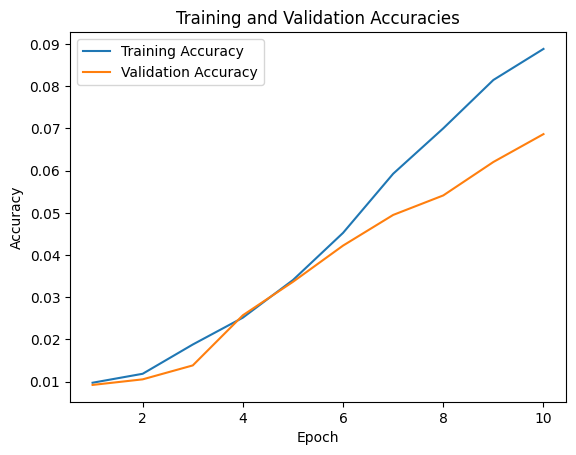

In [ ]:
import matplotlib.pyplot as plt

# Plot training and validation losses starting from index 1
epochs = range(1, len(train_losses) + 1)  # Generate the range of epochs starting from 1

# Plot training and validation accuracies
plt.plot(epochs, train_accuracies, label='Training Accuracy')  # Plot training accuracies over epochs
plt.plot(epochs, val_accuracies, label='Validation Accuracy')  # Plot validation accuracies over epochs
plt.xlabel('Epoch')  # Set label for the x-axis
plt.ylabel('Accuracy')  # Set label for the y-axis
plt.title('Training and Validation Accuracies')  # Set title for the plot
plt.legend()  # Display legend
plt.show()  # Show the plot

**[5.2]** Let's plot the training and validation losses

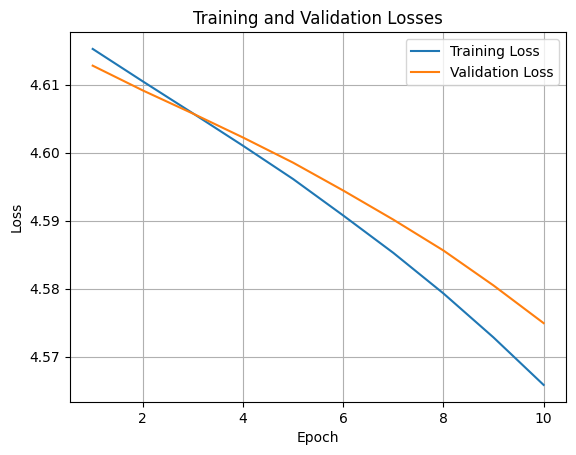

In [ ]:
# Plot training and validation losses starting from index 1
epochs = range(1, len(train_losses) + 1)  # Generate the range of epochs starting from 1

# Plot training and validation losses
plt.plot(epochs, train_losses, label='Training Loss')  # Plot training losses over epochs
plt.plot(epochs, val_losses, label='Validation Loss')  # Plot validation losses over epochs
plt.xlabel('Epoch')  # Set label for the x-axis
plt.ylabel('Loss')  # Set label for the y-axis
plt.title('Training and Validation Losses')  # Set title for the plot
plt.legend()  # Display legend
plt.grid(True)  # Display grid
plt.show()  # Show the plot